In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly 
import plotly.express as px
import plotly.io as pio
from folium import Map, CircleMarker
from folium.plugins import HeatMap
from html2image import Html2Image

In [61]:
import warnings
warnings.filterwarnings("ignore")

# Data Loading

In [63]:
df = pd.read_csv('Boston_Crimes.csv') #Reading the data file

In [8]:
df1_truncated = df[df.YEAR.isin([2015,2019]) == False] #Keeping this for reference, as 2015 and 2019's data is incomplete
df1_truncated['YEAR'].unique()


array([2018, 2016, 2017], dtype=int64)

In [10]:
df['UCR_PART'].unique() #To check which all values are present in UCR_PART field

array(['Part One', 'Part Three', 'Part Two', 'Other', nan], dtype=object)

In [11]:
print(len(df)) #Dataframe with duplicates
df=df.drop_duplicates()
print(len(df)) #updated df without duplicates

426839
426089


In [12]:
df.info() #a preliminary step for EDA

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426089 entries, 0 to 426838
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      426089 non-null  object 
 1   OFFENSE_CODE         426089 non-null  int64  
 2   OFFENSE_CODE_GROUP   426089 non-null  object 
 3   OFFENSE_DESCRIPTION  426089 non-null  object 
 4   DISTRICT             423920 non-null  object 
 5   REPORTING_AREA       426089 non-null  object 
 6   SHOOTING             1380 non-null    object 
 7   OCCURRED_ON_DATE     426089 non-null  object 
 8   YEAR                 426089 non-null  int64  
 9   MONTH                426089 non-null  int64  
 10  DAY_OF_WEEK          426089 non-null  object 
 11  HOUR                 426089 non-null  int64  
 12  UCR_PART             425983 non-null  object 
 13  STREET               413710 non-null  object 
 14  Lat                  398916 non-null  float64
 15  Long             

In [65]:
df['Date'] = pd.to_datetime(df['OCCURRED_ON_DATE']).dt.date #Extract Date from timestamp
df['Time'] = pd.to_datetime(df['OCCURRED_ON_DATE']).dt.time #Extract Time from timestamp
df['Year']=df['YEAR'].apply(str) #Change the datatype of Year (Int) to string to show it appropriately in chart
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,Date,Time,Year
0,I192082859,724,Auto Theft,AUTO THEFT,E18,519,NaN,2019-10-13 09:28:24,2019,10,Sunday,9,Part One,LINCOLN ST,42.259518,-71.121563,"(42.25951765, -71.12156299)",2019-10-13,09:28:24,2019
1,I192082751,724,Auto Theft,AUTO THEFT,E18,493,NaN,2019-10-12 20:11:26,2019,10,Saturday,20,Part One,METROPOLITAN AVE,42.262092,-71.116710,"(42.26209214, -71.11670964)",2019-10-12,20:11:26,2019
2,I192082680,727,Auto Theft,AUTO THEFT - LEASED/RENTED VEHICLE,D14,794,NaN,2019-10-12 15:12:43,2019,10,Saturday,15,Part One,ALLSTON ST,42.352375,-71.135096,"(42.35237455, -71.13509584)",2019-10-12,15:12:43,2019
3,I192082577,724,Auto Theft,AUTO THEFT,D4,130,NaN,2019-10-12 04:41:52,2019,10,Saturday,4,Part One,SAINT JAMES AVE,42.349476,-71.076402,"(42.34947586, -71.07640150)",2019-10-12,04:41:52,2019
4,I192079582,727,Auto Theft,AUTO THEFT - LEASED/RENTED VEHICLE,A15,47,NaN,2019-10-02 08:08:49,2019,10,Wednesday,8,Part One,N MEAD ST,42.381846,-71.066551,"(42.38184582, -71.06655134)",2019-10-02,08:08:49,2019


In [14]:
df_Location = df[df.Location.isin(['(0.00000000, 0.00000000)', '(-1.00000000, -1.00000000)']) == False] #Creating a new dataframe which doesn't have (0,0) or (-1,-1) value - will be used in plotting
df_Location.Location.unique() #checking if the above code has been implemented as expected

array(['(42.25951765, -71.12156299)', '(42.26209214, -71.11670964)',
       '(42.35237455, -71.13509584)', ..., '(42.38272000, -71.02168200)',
       '(42.33987101, -71.16642615)', '(42.36218370, -71.06744204)'],
      dtype=object)

In [15]:
len(df_Location) 

397991

In [16]:
df['SHOOTING']=df['SHOOTING'].fillna('N') #filling blanks with 'N'

In [17]:
df.groupby('SHOOTING')['INCIDENT_NUMBER'].count() #counting records by Y,N

SHOOTING
N    424709
Y      1380
Name: INCIDENT_NUMBER, dtype: int64

In [18]:
df.isnull().sum()

INCIDENT_NUMBER            0
OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                2169
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                 106
STREET                 12379
Lat                    27173
Long                   27173
Location                   0
Date                       0
Time                       0
Year                       0
dtype: int64

In [66]:
df['Month_Name'] = pd.to_datetime(df['OCCURRED_ON_DATE']).dt.month_name() #Add month name to Month Number
df[["MONTH", "Month_Name"]]

,MONTH,Month_Name
0,10,October
1,10,October
2,10,October
3,10,October
4,10,October
...,...,...
426834,5,May
426835,5,May
426836,5,May
426837,5,May


# Data Manipulation & Visualization

In [67]:
f_2016=df[df['Year']=='2016'].groupby(['Year','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2017=df[df['Year']=='2017'].groupby(['Year','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2018=df[df['Year']=='2018'].groupby(['Year','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)

f=pd.concat([f_2016, f_2017, f_2018])

#creating multiple dataframes to present and group data year wise

In [21]:
df["Lat"].replace(to_replace = -1, value = None, inplace=True)

df["Long"].replace(to_replace = -1, value = None, inplace=True)

In [22]:
barchart = px.bar(
    data_frame=f,
    x='Year',
    y="INCIDENT_NUMBER",
    color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Incidents by Year', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='gridon')
barchart.update_layout(xaxis_type='category')
pio.show(barchart)


In [23]:
f_2016=df[df['Year']=='2016'].groupby(['Year','UCR_PART'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2017=df[df['Year']=='2017'].groupby(['Year','UCR_PART'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2018=df[df['Year']=='2018'].groupby(['Year','UCR_PART'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)

f=pd.concat([f_2016, f_2017, f_2018])
barchart = px.bar(
    data_frame=f,
    x='Year',
    y="INCIDENT_NUMBER",
    color='UCR_PART',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Incidents by Severity YOY', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly',
    color_discrete_sequence=["darkturquoise","aqua", "aquamarine", "grey"],
    category_orders={'UCR_PART':
                     ['Part One', 'Part Two', 'Part Three']})
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [24]:
month_wise=df.query('YEAR==[2016,2017,2018]').groupby(['Month_Name','MONTH'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='MONTH')

barchart = px.bar(
    data_frame=month_wise,
    x='Month_Name',
    y="INCIDENT_NUMBER",
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Incidents by Month', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [68]:
f_1=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==1].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==2].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_3=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==3].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_4=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==4].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_5=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==5].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_6=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==6].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_7=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==7].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_8=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==8].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_9=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==9].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_10=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==10].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_11=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==11].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_12=df.query('YEAR==[2016,2017,2018]')[df['MONTH']==12].groupby(['Month_Name','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)

f=pd.concat([f_1, f_2,f_3,f_4,f_5,f_6,f_7,f_8,f_9,f_10,f_11,f_12])

In [29]:

barchart = px.bar(
    data_frame=f,
    x='Month_Name',
    y="INCIDENT_NUMBER",
    color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Top 5 Offenses by Month', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [30]:
f_1=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Monday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Tuesday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_3=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Wednesday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_4=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Thursday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_5=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Friday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_6=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Saturday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_7=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Sunday"').groupby(['DAY_OF_WEEK','OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)


f=pd.concat([f_1, f_2,f_3,f_4,f_5,f_6,f_7])

In [31]:
barchart = px.bar(
    data_frame=f,
    x='DAY_OF_WEEK',
    y="INCIDENT_NUMBER",
    color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Top 5 Offenses by Week', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [26]:
f_1=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Monday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_2=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Tuesday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_3=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Wednesday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_4=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Thursday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_5=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Friday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_6=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Saturday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)
f_7=df.query('YEAR==[2016,2017,2018] & DAY_OF_WEEK=="Sunday"').groupby(['DAY_OF_WEEK'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False).head(5)


f=pd.concat([f_1, f_2,f_3,f_4,f_5,f_6,f_7])

In [27]:
barchart = px.bar(
    data_frame=f,
    x='DAY_OF_WEEK',
    y="INCIDENT_NUMBER",
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Crime Count by Day', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [32]:
f=df.query('YEAR==[2016,2017,2018]').groupby(['HOUR'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)

In [33]:
f['Percentage']=round(f['INCIDENT_NUMBER']*100/f['INCIDENT_NUMBER'].sum(),2)
f.head()

,HOUR,INCIDENT_NUMBER,Percentage
17,17,19457,6.50
18,18,18991,6.35
16,16,18628,6.23
12,12,17514,5.85
19,19,16520,5.52


In [34]:
barchart = px.bar(
    data_frame=f,
    x='HOUR',
    y='Percentage',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='Percentage',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Crime Percent by Hour', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly',
    category_orders={'HOUR':
                     [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426089 entries, 0 to 426838
Data columns (total 21 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   INCIDENT_NUMBER      426089 non-null  object
 1   OFFENSE_CODE         426089 non-null  int64 
 2   OFFENSE_CODE_GROUP   426089 non-null  object
 3   OFFENSE_DESCRIPTION  426089 non-null  object
 4   DISTRICT             423920 non-null  object
 5   REPORTING_AREA       426089 non-null  object
 6   SHOOTING             426089 non-null  object
 7   OCCURRED_ON_DATE     426089 non-null  object
 8   YEAR                 426089 non-null  int64 
 9   MONTH                426089 non-null  int64 
 10  DAY_OF_WEEK          426089 non-null  object
 11  HOUR                 426089 non-null  int64 
 12  UCR_PART             425983 non-null  object
 13  STREET               413710 non-null  object
 14  Lat                  397991 non-null  object
 15  Long                 397991 non-nu

# Geo


In [36]:
streets_crime=df.query('YEAR==[2016,2017,2018]').groupby(['STREET'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
streets_crime['Percentage']=round(streets_crime['INCIDENT_NUMBER']*100/streets_crime['INCIDENT_NUMBER'].sum(),2)
streets_crime.sort_values(by='Percentage',ascending=False).head(15)

,STREET,INCIDENT_NUMBER,Percentage
4284,WASHINGTON ST,13269,4.59
475,BLUE HILL AVE,7349,2.54
539,BOYLSTON ST,6713,2.32
1273,DORCHESTER AVE,4738,1.64
4087,TREMONT ST,4580,1.58
2683,MASSACHUSETTS AVE,4439,1.53
1964,HARRISON AVE,4414,1.53
795,CENTRE ST,4174,1.44
990,COMMONWEALTH AVE,3873,1.34
2183,HYDE PARK AVE,3343,1.16


In [37]:
streets_crime['INCIDENT_NUMBER'].head()

4284    13269
475      7349
539      6713
1273     4738
4087     4580
Name: INCIDENT_NUMBER, dtype: int64

In [38]:
barchart = px.bar(
    data_frame=streets_crime[:15],
    x='STREET',
    y='Percentage',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='Percentage',
    labels={ "STREET":"STREET","Percentage":"Percentage of Crimes"},# map the labels of the figure
    title='Crimes by Street', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
    #category_orders={'HOUR':
     #                [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
#barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [35]:

#district_incidents=district_severity[['DISTRICT', 'INCIDENT_NUMBER']].sort_values(by='INCIDENT_NUMBER', ascending=False)
district=['E18','D14','D4','A15','B3','A1','A7','E5','B2','C11','C6','E13']
district_severity = pd.DataFrame()
for i in district:
  g=df.query('YEAR==[2016,2017,2018]')[df['DISTRICT']==i].groupby(['DISTRICT', 'UCR_PART'],as_index=False)['INCIDENT_NUMBER'].count()
  district_severity=pd.concat([district_severity,g])
district_severity=district_severity.sort_values(by='INCIDENT_NUMBER', ascending=False)

district_incidents=df.query('YEAR==[2016,2017,2018]').groupby(['DISTRICT'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
barchart = px.bar(
    data_frame=district_severity,
    x='DISTRICT',
    y="INCIDENT_NUMBER",
    color='UCR_PART',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={"INCIDENT_NUMBER":"Total Incidents",
    "OFFENSE_CODE_GROUP":"OFFENSE_CODE_GROUP"},           # map the labels of the figure
    title='Count of Incidents by District and Severity', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly',
    category_orders={'UCR_PART':
                     ['Part One', 'Part Two', 'Part Three', 'Other']},
                     )
barchart.update_layout(xaxis_type='category', xaxis={'categoryarray':district_incidents["DISTRICT"]})
pio.show(barchart)

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny4400000gn/T/ipykernel_29824/1132626879.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_v/8nkp8gjn1xj3pkbpgjhny440

In [42]:
district_crime=df.query('YEAR==[2016,2017,2018]').groupby(['DISTRICT'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
district_crime['Percentage']=round(district_crime['INCIDENT_NUMBER']*100/district_crime['INCIDENT_NUMBER'].sum(),2)
district_crime.sort_values(by='Percentage',ascending=False).head(15)



,DISTRICT,INCIDENT_NUMBER,Percentage
3,B2,47328,15.91
5,C11,40425,13.59
8,D4,38179,12.83
4,B3,34285,11.52
0,A1,33151,11.14
6,C6,21726,7.30
7,D14,18965,6.37
9,E13,16543,5.56
10,E18,16310,5.48
11,E5,12446,4.18


In [47]:
crime_totals=df.query('YEAR==[2016,2017,2018]').groupby(['OFFENSE_CODE_GROUP'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
crime_totals['Percentage']=round(crime_totals['INCIDENT_NUMBER']*100/crime_totals['INCIDENT_NUMBER'].sum(),2)
crime_totals.sort_values(by='Percentage',ascending=False).head(15)

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER,Percentage
43,Motor Vehicle Accident Response,35235,11.78
34,Larceny,23850,7.97
40,Medical Assistance,23054,7.71
31,Investigate Person,17900,5.98
46,Other,16465,5.50
61,Simple Assault,14898,4.98
15,Drug Violation,14786,4.94
63,Vandalism,14149,4.73
64,Verbal Disputes,12960,4.33
32,Investigate Property,11089,3.71


In [39]:
shooting_district=df[df['SHOOTING']=='Y'].query('YEAR==[2016,2017,2018]').groupby(['DISTRICT'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
shooting_district['Percentage']=round(shooting_district['INCIDENT_NUMBER']*100/shooting_district['INCIDENT_NUMBER'].sum(),2)
shooting_district.sort_values(by='Percentage',ascending=False).head(15)

,DISTRICT,INCIDENT_NUMBER,Percentage
3,B2,313,32.33
4,B3,222,22.93
5,C11,186,19.21
9,E13,62,6.40
6,C6,45,4.65
8,D4,45,4.65
10,E18,32,3.31
2,A7,18,1.86
0,A1,15,1.55
7,D14,15,1.55


In [43]:
shooting_street=df[df['SHOOTING']=='Y'].query('YEAR==[2016,2017,2018]').groupby(['STREET'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)
shooting_street['Percentage']=round(shooting_street['INCIDENT_NUMBER']*100/shooting_street['INCIDENT_NUMBER'].sum(),2)
shooting_street.sort_values(by='Percentage',ascending=False).head(15)

,STREET,INCIDENT_NUMBER,Percentage
298,WASHINGTON ST,44,4.64
31,BLUE HILL AVE,38,4.00
64,COLUMBIA RD,20,2.11
92,DUDLEY ST,19,2.00
277,TREMONT ST,14,1.48
88,DORCHESTER AVE,13,1.37
193,MASSACHUSETTS AVE,13,1.37
56,CENTRE ST,13,1.37
252,SHAWMUT AVE,10,1.05
238,RIVER ST,10,1.05


In [44]:
barchart = px.bar(
    data_frame=district_crime,
    x='DISTRICT',
    y='Percentage',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='Percentage',
    labels={ "DISTRICT":"DISTRICT","Percentage":"Percentage of Crimes"},# map the labels of the figure
    title='Crimes by District', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
    #category_orders={'HOUR':
     #                [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
#barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [48]:
barchart = px.bar(
    data_frame=shooting_district,
    x='DISTRICT',
    y='Percentage',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='Percentage',
    labels={ "DISTRICT":"DISTRICT","Percentage":"Percentage of Shootings"},# map the labels of the figure
    title='Shootings by District', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
    #category_orders={'HOUR':
     #                [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
#barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [45]:
barchart = px.bar(
    data_frame=shooting_street[:15],
    x='STREET',
    y='Percentage',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='Percentage',
    labels={ "STREET":"STREET","Percentage":"Percentage of Crimes"},# map the labels of the figure
    title='Shootings by Street', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
    #category_orders={'HOUR':
     #                [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
#barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [49]:
barchart = px.bar(
    data_frame=crime_totals[:15],
    x='OFFENSE_CODE_GROUP',
    y='INCIDENT_NUMBER',
    #color='OFFENSE_CODE_GROUP',               
    opacity=0.9,             
    orientation="v",              
    barmode='relative',
    text='INCIDENT_NUMBER',
    labels={ "OFFENSE_CODE_GROUP":"Offense","Percentage":"Percentage of Crimes"},# map the labels of the figure
    title='Crimes by Offenses (Top 15)', # figure title
    width=1400,                   # figure width in pixels
    height=500,                   # figure height in pixels
    template='plotly')
    #category_orders={'HOUR':
     #                [8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,0,1,2,3,4,5,6,7]})
#barchart.update_layout(xaxis_type='category')
pio.show(barchart)

In [50]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=crime_totals['OFFENSE_CODE_GROUP'][:15], y=crime_totals['INCIDENT_NUMBER'][:15], name="Percentage of crimes"),
    secondary_y=True,
)

#fig.add_trace(
#    go.Scatter(x=crime_totals['OFFENSE_CODE_GROUP'][:15], y=crime_totals['Percentage'][:15], name="yaxis2 data"),
#    secondary_y=True,
#)
fig.add_bar(x=crime_totals['OFFENSE_CODE_GROUP'][:15], y=crime_totals['Percentage'][:15], name="Count of incidents", secondary_y=False, opacity=0.9)
# Add figure title
fig.update_layout(
    title_text="Volume of Incidents by Offenses"
)

# Set x-axis title
fig.update_xaxes(title_text="Offense Group")

# Set y-axes titles
fig.update_yaxes(title_text="Percentage of Offenses (%)", secondary_y=False)
fig.update_yaxes(title_text="# Incidents", secondary_y=True)

fig.show()


In [52]:
#function to generate and save heat map
def generate_map(data,name):
    map_ = Map(location = [42.326145, -71.064083], # selected a center for map to focus on
               tiles = "OpenStreetMap",
               zoom_start = 12)
    for d in data:
        ni = name+'.html'
        d.Lat.fillna(0, inplace = True)
        d.Long.fillna(0, inplace = True)
        HeatMap(radius = 16, data = d).add_to(map_) #added datapoints onto the Open street map
        map_.save(ni) #saving the html file
        hti = Html2Image()
        with open(ni) as f:
            hti.screenshot(f.read(), save_as=name+'.png') # saving the html file as png image
    return map_
#Function to display map
def display_map(data):
    map_ = Map(location = [42.326145, -71.064083], # selected a center for map to focus on
               tiles = "OpenStreetMap",
               zoom_start = 11)
    for d in data:
        d.Lat.fillna(0, inplace = True)
        d.Long.fillna(0, inplace = True)
        HeatMap(radius = 16, data = d).add_to(map_) #added datapoints onto the Open street map
    return map_

In [53]:
display_map([df[["Lat","Long"]]]) # displaying heatmap for overall data

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\724899962.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\724899962.py:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
#creating new column "quarterYear" to generate maps for each quarter
df["quarter"] = pd.DatetimeIndex(df['Date']).quarter 
df["quarterYear"] = df.YEAR.astype(str) + df.quarter.astype(str)

In [55]:
#heatmaps of crimes for every 3 months (Intervals)
masks = df["quarterYear"].value_counts().index
i=0
for mask in masks:
    df_map = df.loc[df.quarterYear == mask][["Lat", "Long"]]
    generate_map([df_map],mask) # use of this function saves both html file and png file of the heat map

In [56]:
#heatmaps for every 3 months (Cumulative)
masks=list(df["quarterYear"].value_counts().index)
masks.sort()
i=0
for mask in masks:
    if i==0:
        df_map = df.loc[df.quarterYear == mask][["Lat", "Long"]]
    else:
        df_map =df_map.append(df.loc[df.quarterYear == mask][["Lat", "Long"]])
    i+=1
    generate_map([df_map],mask) # use of this function saves both html file and png file of the heat map

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\1138828286.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\1138828286.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\1138828286.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\1138828286.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\Supriya Malla\AppData\Local\Temp\ipykernel_38928\1138828286.py:9: FutureWarning:

The frame.append method is deprecated and will be removed from pandas

In [57]:
#heatmap with UCR part
df["UCR_PART"]

0           Part One
1           Part One
2           Part One
3           Part One
4           Part One
             ...    
426834    Part Three
426835    Part Three
426836    Part Three
426837    Part Three
426838    Part Three
Name: UCR_PART, Length: 426089, dtype: object

In [58]:
#Converting UCR_Part to numeric value
df["UCR_numeric"]=np.where(df['UCR_PART'] == "Part One", 3, np.where(df['UCR_PART'] ==  "Part Two", 2,
                                                   np.where(df['UCR_PART'] ==  "Part Three",1,0))) 

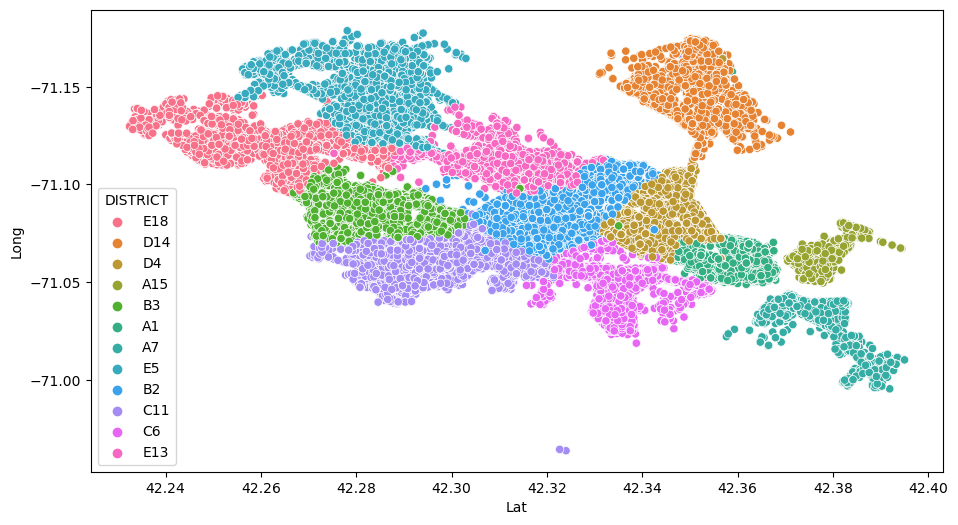

In [60]:
plt.subplots(figsize = (11, 6))

sns.scatterplot(x = "Lat",

                y = "Long",

                hue = "DISTRICT",

                data = df);

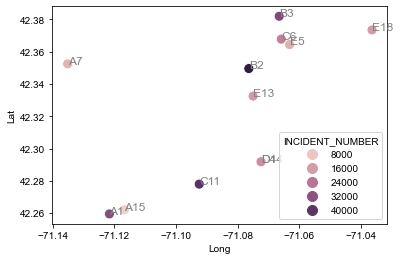

In [96]:
g=df.query('YEAR==[2016,2017,2018]').groupby(['DISTRICT'],as_index=False)['INCIDENT_NUMBER'].count().sort_values(by='INCIDENT_NUMBER', ascending=False)

#g['INCIDENTS']=g.groupby('DISTRICT')['INCIDENT_NUMBER'].count()

g['Lat']=df['Lat']

g['Long']=df['Long']

sns.scatterplot(x = "Long",

                y = "Lat",

                size ='INCIDENT_NUMBER',

                hue='INCIDENT_NUMBER',

                sizes=(100, 100),

                data = g);

sns.set(rc={'figure.figsize':(11.7,8.27)})

for line in range(0,g.shape[0]):

     plt.text(g.Long[line], g.Lat[line], g.DISTRICT[line], size='medium', color='grey' )